### Packages

In [1]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
import IPython
from utils import *
%matplotlib inline

/home/sb/anaconda3/envs/dlcoursera6/lib/python3.6/site-packages/pydub/utils.py:165: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


In [2]:
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, GRU, Bidirectional, TimeDistributed, LSTM, Conv1D
from keras.layers import Dropout, Input, Masking, BatchNormalization, Reshape
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint

Using TensorFlow backend.


### Example audio

In [3]:
# trigger word
IPython.display.Audio("./data/raw/trigger_words/1.wav")

In [4]:
# random non-trigger word
IPython.display.Audio("./data/raw/non_trigger_words/4.wav")

In [5]:
# background noise
IPython.display.Audio("./data/raw/backgrounds/1.wav")

### Create dataset from raw audio

#### Convert raw audio to spectrogram

In [6]:
## Audio recording: 
# microphone records and captures (later our ear perceives) little changes in air pressure over time
# Audio sampled at 44100 Hz => 44100 numbers per sec

raw_audio = "data/examples/example_train.wav"
_, data = wavfile.read(raw_audio)
print("wavfile.read output # of dims = ", data.ndim)
print("Raw audio clip dimension: (# of time steps, ) = ", data[:,0].shape)
IPython.display.Audio(raw_audio)

wavfile.read output # of dims =  2
Raw audio clip dimension: (# of time steps, ) =  (441000,)


Spectrogram output dimension: (# of frequencies, # of time steps) =  (101, 5511)


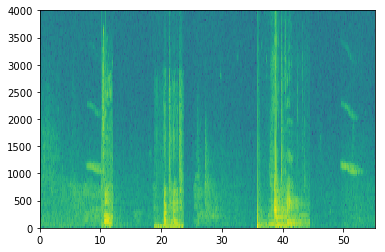

In [7]:
## Spectrogram:
# Compute spectrogram of this audio to measure quantity of each frequency at any time. 
# Calculated using sliding window and fourier transform on each window to get frequencies
# x axis is timesteps, y axis is frequency
# blue => less active frequency. green => more active frequencies.

x = gen_spectrogram("data/examples/example_train.wav")
print("Spectrogram output dimension: (# of frequencies, # of time steps) = ", x.shape)

#### Number of time-steps (discretization) at different stages of solution

In [8]:
## Raw audio: 10 sec clip. 44100 timesteps per sec
# Discretized to 441000 time steps or intervals
# => 10sec/441000timesteps =~  .000023 secs/timestep  

In [9]:
## Raw audio 10sec clip read through Pydub module: Outputs 10000 timesteps 
# (This is done to overlay trigger-words and create labeled dataset)
# Discretized to 10000 timesteps or intervals
# => 10sec/10000timesteps = 0.001 secs/timestep (discretized to 1ms interval)

In [10]:
## Spectrogram: Outputs 5511 timesteps
# Discretized to 5511 timesteps or intervals
# => 10sec/5511timesteps =~ .0018 secs/timestep

In [11]:
## Input to neural network
# Tx = 5511
# => 10sec/5511timesteps =~ .0018 secs/timestep

In [12]:
## Output of neural network
# Discretized to 1375 timesteps or intervals
# Ty = 1375
# => 10sec/1375 =~ .0072 secs/timestep

# Predict if finish of "activate" recognized at end of each of these intervals

In [13]:
# All numbers:
T_raw_audio = 441000
T_pydub_audio = 10000
T_x = 5511
T_y = 1375

#### Create speech dataset example (from background and trigger/non-trigger words)

In [14]:
# This is done because labeled speech data is difficult to find.
# Also, we can automate labeling y<t> when creating examples with trigger words 
# instead of listening to audio and manually labeling them.

In [15]:
# Load the audio using pydub
trigger_word_audios, non_trigger_word_audios, background_audios = load_raw_audio()

In [16]:
# Number of examples of each type of audio
len(trigger_word_audios), len(non_trigger_word_audios), len(background_audios)

(10, 10, 2)

In [17]:
# Dimensions of each type of audio
# 10 sec background_audios => 10000 timesteps in pydub output
# 1 sec trigger/non-trigger words => ~1000 timesteps in pydub output
len(trigger_word_audios[0]), len(non_trigger_word_audios[0]), len(background_audios[0])

(1579, 600, 10000)

In [18]:
# Overlay trigger/non-trigger words onto background_audios
# Randomly 0-4 trigger words, 0-2 non-trigger words

# Set y<t+1> to y<t+50> to 1 if y<t> is the finish of trigger word "activate"
# Here <t> is w.r.t Ty i.e. output of neural network

In [19]:
# Function to overlay word audio on background audio
def overlay_word_on_background_audio(word_audio, background_audio, existing_overlays, y_out = None):
    
    # Number of timesteps in word audio
    word_timesteps = len(word_audio)
    
    # Keep finding interval to insert word, until no overlap with existing overlays
    overlap = 1
    while overlap==1:  
        # Get interval to insert word
        word_start_timestep = np.random.randint(0, T_pydub_audio - word_timesteps)
        word_end_timestep = word_start_timestep + word_timesteps - 1
        # Check if overlaps existing overlays and find unique one
        overlap = 0
        for start_timestep,end_timestep in existing_overlays:
            if word_start_timestep <= end_timestep and word_end_timestep >= start_timestep:
                overlap = 1
                break
    
    # Found interval. Add it to existing overlays
    overlay_interval = (word_start_timestep, word_end_timestep)
    existing_overlays.append(overlay_interval)
    
    # Overlay the word onto background_audio using pydub
    overlay_audio = background_audio.overlay(word_audio, position = word_start_timestep)
    
    # Set y to ones for 50 timesteps after word_end_timestep w.r.t output discretization (i.e. not pydub discretization)
    if y_out is not None:
        word_end_timestep_wrt_yout = int(word_end_timestep * T_y / T_pydub_audio)
        for timestep in range(word_end_timestep_wrt_yout + 1, word_end_timestep_wrt_yout + 51):
            if timestep < T_y: y_out[0,timestep] = 1
    
    return overlay_audio, overlay_interval, y_out    

In [20]:
# Original background audio
background_audios[0].export("scratch/pre_overlay_test.wav", format="wav")
IPython.display.Audio("scratch/pre_overlay_test.wav")

Overlap interval:  (7293, 8871)


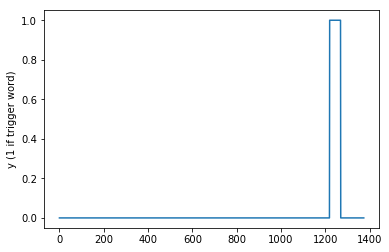

In [31]:
# Test after overlay trigger word on background audio
np.random.seed(10)
y_out = np.zeros( (1, T_y) )
overlay_audio, overlay_interval, y_out = overlay_word_on_background_audio(trigger_word_audios[0], background_audios[0],
                                                                          [(2000, 3000)], y_out)
print("Overlap interval: ", overlay_interval)
plt.plot(y_out[0])
plt.ylabel("y (1 if trigger word)")
overlay_audio.export("scratch/overlay_test.wav", format="wav")
IPython.display.Audio("scratch/overlay_test.wav")

In [27]:
# Function to create speech dataset
def create_speech_dataset(trigger_word_audios, non_trigger_word_audios, background_audios, num_examples_per_background = 1):
    
    # Total number of examples
    print("Number of background_audios is:", len(background_audios))
    total_num_examples = len(background_audios) * num_examples_per_background
    print("Total number of training examples to be generated:", total_num_examples)
    print("Number of training examples per background:", num_examples_per_background)
    
    # Initialize final audios
    overlay_audios = []
    X = np.zeros( (total_num_examples, T_x, 101) )  ; # 101 is number of frequencies per time step from sp
    Y = np.zeros( (total_num_examples, T_y, 1) )
     
    np.random.seed(10)
        
    # Iterate over each background audio
    example_num = 0
    for background in background_audios:    
        
        # Initialize existing overlays
        existing_overlays = []
        
        # Generate num_examples audios
        for num in range(num_examples_per_background):

            # Make background quieter and initialize final audio
            overlay_audio = background - 20

            # Initialize y_out labels       
            y_out = np.zeros( (1, T_y) )                   

            # pick 0-4 trigger words and overlay on background
            trigger_idxs = np.random.randint(0, len(trigger_word_audios), size = np.random.randint(0,5))
            trigger_words = [trigger_word_audios[i] for i in trigger_idxs]
            for trigger_word in trigger_words:
                overlay_audio, overlay_interval, y_out = overlay_word_on_background_audio(trigger_word, 
                                                                                          overlay_audio,
                                                                                          existing_overlays, 
                                                                                          y_out)            

            # pick 0-2 non trigger words and overlay on background
            non_trigger_idxs = np.random.randint(0, len(non_trigger_word_audios), size = np.random.randint(0,3))
            non_trigger_words = [non_trigger_word_audios[i] for i in non_trigger_idxs]
            for non_trigger_word in non_trigger_words:
                overlay_audio, _ , _ = overlay_word_on_background_audio(non_trigger_word, 
                                                                                          overlay_audio,
                                                                                          existing_overlays, 
                                                                                          None)
            # Standardize volume of the clip
            overlay_audio.apply_gain(-20.0 - overlay_audio.dBFS)

            # Save the overlay_audio exammple as wav file
            overlay_audio_fname = "scratch/train_example_" + str(example_num) + ".wav"                                 
            fh = overlay_audio.export(overlay_audio_fname, format="wav")
            print("Created data point audio: ", overlay_audio_fname)
            
            # Get the x input (spectrogram) for this example
            x = gen_spectrogram(overlay_audio_fname)

            # Save x and y_out
            X[example_num,:,:] = x.T ; # x is of dim (101, T_x)
            Y[example_num,:,:] = y_out.T  ; # y is of dim (1, T_y)
    
            print("Finished creating data point idx #: ", example_num)
            example_num += 1

            
    return X, Y

Number of background_audios is: 1
Total number of training examples to be generated: 1
Number of training examples per background: 1
Created data point audio:  scratch/train_example_0.wav
Finished creating data point idx #:  0


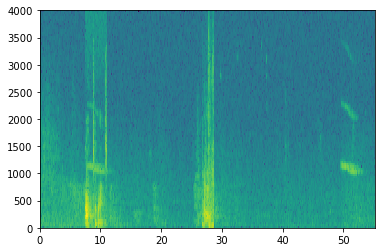

In [28]:
# Test it
train_X, train_Y = create_speech_dataset(trigger_word_audios, non_trigger_word_audios, [background_audios[0]], 1)

(1, 5511, 101) (1, 1375, 1)
(5511, 101) (1375, 1)


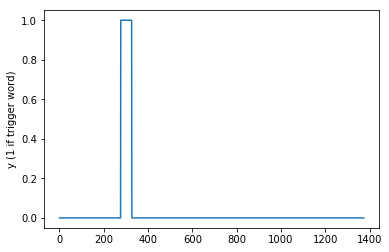

In [30]:
# Sanity check results
print(train_X.shape, train_Y.shape)
x = train_X[0] ;  y_out = train_Y[0]
print(x.shape, y_out.shape)
plt.plot(y_out.T[0])
plt.ylabel("y (1 if trigger word)")
IPython.display.Audio("scratch/train_example_0.wav")

### Model

#### Training and CV sets

In [25]:
# Training examples generated using above process
X_train = np.load("data/dataset/X.npy")
Y_train = np.load("data/dataset/Y.npy")

# CV examples generated using manual recording and labeling to match test set distribution
X_cv = np.load("data/dataset/X_dev.npy")
Y_cv = np.load("data/dataset/Y_dev.npy")

# Print shapes
X_train.shape, Y_train.shape, X_cv.shape, Y_cv.shape

((26, 5511, 101), (26, 1375, 1), (25, 5511, 101), (25, 1375, 1))

#### Model

In [ ]:
# Input
# LSTMs and GRUs have inputs of shape (number_of_samples, number_of_timesteps, number_of_features)

# Layer1
# Initially all 101 frequencies are features and 5511 timesteps (T_x)
# Reduce timesteps to 1375 to match T_y using 1D Conv layer with appropriate filtersize (f) and stride (s)
# Increase number of features from 101 to 196 i.e. number of low level patterns to capture from initial input sequence

# Layers 2 and 3
# 2 stacks of GRUs
# Each stack has dropout, batchnorm for regularization, speedup resp.
# Each GRU has certain number of memory units - 128 (number of different things or features in frequency to remember)
# This is the number of features to subsequent GRU layer.

# Layers 4
# Dense layer + Sigmoid (since y is 0 or 1)

In [35]:
# Model definition
def trigger_word_model():
    
    X_in = Input(shape = (T_x, 101))
    
    # Layer 1: Conv1D
    X = Conv1D(196, kernel_size = 15, strides = 4)(X_in)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = Dropout(0.8)(X)
    
    # Layer 2: GRU
    X = GRU(units = 128, return_sequences = True)(X)  ; # return_sequences True feeds hidden states to next layer
    X = Dropout(0.8)(X)
    X = BatchNormalization()(X)
    
    # Layer 3: GRU
    X = GRU(units = 128, return_sequences = True)(X)  ; # return_sequences True feeds hidden states to next layer
    X = Dropout(0.8)(X)
    X = BatchNormalization()(X)
    X = Dropout(0.8)(X)
   
    # Layer 4: Dense + Sigmoid
    X = TimeDistributed(Dense(1, activation = 'sigmoid'))(X) ; # TimeDistributed shares weights across all T_y timesteps.
    
    # model
    model = Model(inputs = X_in, outputs = X)
    
    return model

In [38]:
# Create the model
model = trigger_word_model()
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 5511, 101)         0         
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization_8 (Batch (None, 1375, 196)         784       
_________________________________________________________________
activation_4 (Activation)    (None, 1375, 196)         0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 1375, 196)         0         
_________________________________________________________________
gru_6 (GRU)                  (None, 1375, 128)         124800    
_________________________________________________________________
dropout_12 (Dropout)         (None, 1375, 128)         0         
__________

In [39]:
# Compile the model
optimizer_func = Adam(lr = 0.0001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.01)
model.compile(loss='binary_crossentropy', optimizer=optimizer_func, metrics=["accuracy"])

In [42]:
# Fit the model
model.fit(X_train, Y_train, batch_size = 5, epochs=10)

Epoch 1/10
26/26 [==============================] - 6s - loss: 1.2389 - acc: 0.5028     
Epoch 2/10
26/26 [==============================] - 6s - loss: 1.2187 - acc: 0.5028     
Epoch 3/10
26/26 [==============================] - 6s - loss: 1.1772 - acc: 0.5128     
Epoch 4/10
26/26 [==============================] - 6s - loss: 1.1797 - acc: 0.5046     
Epoch 5/10
26/26 [==============================] - 6s - loss: 1.1344 - acc: 0.5074     
Epoch 6/10
26/26 [==============================] - 6s - loss: 1.1037 - acc: 0.5119     
Epoch 7/10
26/26 [==============================] - 6s - loss: 1.0964 - acc: 0.5213     
Epoch 8/10
26/26 [==============================] - 6s - loss: 1.0661 - acc: 0.5217     
Epoch 9/10
26/26 [==============================] - 6s - loss: 1.0437 - acc: 0.5257     
Epoch 10/10
26/26 [==============================] - 6s - loss: 1.0289 - acc: 0.5243     


In [44]:
## Pre-trained model on a larger dataset
# Create the model
model = load_model('models/tr_model.h5')
model.summary()
# Compile the model
optimizer_func = Adam(lr = 0.0001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.01)
model.compile(loss='binary_crossentropy', optimizer=optimizer_func, metrics=["accuracy"])
# Fit the model
model.fit(X_train, Y_train, batch_size = 5, epochs=1)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 5511, 101)         0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 1375, 256)         388096    
_________________________________________________________________
batch_normalization_7 (Batch (None, 1375, 256)         1024      
_________________________________________________________________
activation_3 (Activation)    (None, 1375, 256)         0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 1375, 256)         0         
_________________________________________________________________
gru_5 (GRU)                  (None, 1375, 128)         147840    
_________________________________________________________________
dropout_8 (Dropout)          (None, 1375, 128)         0         
__________

#### Evaluate the model

In [45]:
# Get CV accuracy. 
loss, accuracy = model.evaluate(X_cv, Y_cv)
print("CV accuracy = ", accuracy)

# But accuracy is not good classification metric here due to imbalanced datasets with 0s.

25/25 [==============================] - 1s
CV accuracy =  0.944290935993


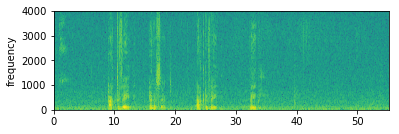

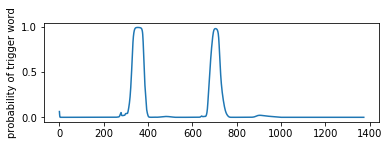

In [53]:
# Make prediction and generate chime on trigger word identification
def trigger_word_detection(audio_file):
    
    # Plot x 
    plt.subplot(2, 1, 1)
    plt.ylabel('frequency')
    x = gen_spectrogram(audio_file) 
    x = np.expand_dims(x.swapaxes(0,1), axis = 0) ; # change it to (T_x,101) and then (1,T_x,101) 
    y_pred = model.predict(x)
    plt.show()

    # Plot y
    plt.subplot(2, 1, 1)
    plt.plot(y_pred[0,:,0])
    plt.ylabel('probability of trigger word')
    plt.show()
    
    # Chime
    audio_clip = AudioSegment.from_wav(audio_file)
    audio_clip_timesteps = audio_clip.duration_seconds * 1000
    chime_clip = AudioSegment.from_wav('data/examples/chime.wav')
    prev_trigger_timestep_lapse = 0
    for t in range(T_y):
        prev_trigger_timestep_lapse += 1
        # probability threshold of 0.5, 
        # timestep window of 60 (some margin on 50 consecutive steps which have 1)
        if y_pred[0,t,0] > 0.5 and prev_trigger_timestep_lapse > 60:
            audio_clip = audio_clip.overlay(chime_clip, position = audio_clip_timesteps * t / T_y)
            prev_trigger_timestep_lapse = 0
    audio_clip.export("scratch/ypred_chime.wav", format='wav')       
            

# Call trigger detection
trigger_word_detection("./data/raw/dev/2.wav")
IPython.display.Audio("scratch/ypred_chime.wav")

# It is able to ignore 2 other words that are not trigger words (low probability and no chime generate)